# Capstone Project - The Battle of the Neighborhoods
## Applied Data Science Capstone by IBM/Coursera

## Table of contents
* Introduction: Business Problem
* Data
* Methodology
* Analysis
* Results and Discussion
* Conclusion

## Introduction: Business Problem

In this project we will try to find an optimal location for a restaurant. Specifically, this report will be targeted to stakeholders interested in opening an **Thai restaurant** in **Sydney**, Australia.

Since there are lots of restaurants in Sydney we will try to detect **locations that are not already crowded with restaurants**. We are also particularly interested in **areas with no Thai restaurants in vicinity**. We would also prefer locations **as close to city center as possible**, assuming that first two conditions are met.

We will use our data science powers to generate a few most promising neighborhoods based on this criteria. Advantages of each area will then be clearly expressed so that best possible final location can be chosen by stakeholders.

## Data
Based on definition of our problem, factors that will influence our decission are:
* number of existing restaurants in the neighborhood (any type of restaurant)
* number of and distance to thai restaurants in the neighborhood, if any
* distance of neighborhood from city center

We decide to webscrap of a list of Sydney suburbs, to define our neighborhoods

Following data sources will be needed to extract/generate the required information:
* Name and postcode of suburbs through web-scraping
* Coordinate of suburbs and city center, ie Sydney's Town hall are obtained using **Google Maps API geocoding**
* Number of restaurants, their type and their location location in every neighborhood will be obtained using **Foursquare API**
* Number of metro station and their location location in every neighborhood will be obtained using **Foursquare API**

In [2]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans

import pickle
import folium
import geopy.distance
%matplotlib inline

### Suburb Candidates

We download postcodes and suburbs from https://data.mongabay.com/igapo/australia/postcodes/sydney-numeric.html and find the associated coordinates through Google Maps geocoding API.
Finally, the distance to the city center is computed for each point.

In [2]:
# web scrapping

url = 'https://data.mongabay.com/igapo/australia/postcodes/sydney-numeric.html'
r = requests.get(url, headers = {'User-Agent' : 'Mozilla/5.0'})
soup = BeautifulSoup(r.content, 'lxml')
codes = []
names = []

for line in soup.select_one('h1:contains("Postal codes") ~ font [size="2"]').text.split('\n'):
    if line[:4]:
        codes.append(line[:4]), names.append(line[5:])
df = pd.DataFrame(list(zip(codes, names)), columns = ['code', 'name'])

In [3]:
df

,code,name
0,2000,Australia Square Post Office
1,2000,Circular Quay
2,2000,Clarence Street Post Office
3,2000,Cockatoo Island
4,2000,Darling Harbour
5,2000,Dawes Point
6,2000,Garden Island
7,2000,Grosvenor Place Post Office
8,2000,Haymarket
9,2000,Millers Point


In [3]:
storage_path = r'/Users/luca/Downloads/jupyter'

Reference for Google maps API: https://matthewkudija.com/blog/2018/11/19/google-maps-api/

In [8]:
# Google maps API key
fname = storage_path+r'/GoogleMapsAPIKey.txt'
file  = open(fname, 'r')
apiKey = file.read()

In [9]:
# Google Maps geocoding API
def get_lat_lng(apiKey, address):
    """
    Returns the latitude and longitude of a location using the Google Maps Geocoding API. 
    API: https://developers.google.com/maps/documentation/geocoding/start

    # INPUT -------------------------------------------------------------------
    apiKey                  [str]
    address                 [str]

    # RETURN ------------------------------------------------------------------
    lat                     [float] 
    lng                     [float] 
    """
    import requests
    url = ('https://maps.googleapis.com/maps/api/geocode/json?address={}&key={}'
           .format(address.replace(' ','+'), apiKey))
    try:
        response = requests.get(url)
        resp_json_payload = response.json()
        lat = resp_json_payload['results'][0]['geometry']['location']['lat']
        lng = resp_json_payload['results'][0]['geometry']['location']['lng']
    except:
        print('ERROR: {}'.format(address))
        lat = 0
        lng = 0
    return lat, lng


In [10]:
df['latitude']=np.nan
df['longitude']=np.nan
df

,code,name,latitude,longitude
0,2000,Australia Square Post Office,NaN,NaN
1,2000,Circular Quay,NaN,NaN
2,2000,Clarence Street Post Office,NaN,NaN
3,2000,Cockatoo Island,NaN,NaN
4,2000,Darling Harbour,NaN,NaN
5,2000,Dawes Point,NaN,NaN
6,2000,Garden Island,NaN,NaN
7,2000,Grosvenor Place Post Office,NaN,NaN
8,2000,Haymarket,NaN,NaN
9,2000,Millers Point,NaN,NaN


In [11]:
# add coordinates of suburbs
for i in df.index:
    address = df.loc[i,'name']+', Sydney, Australia'
    df.loc[i,['latitude', 'longitude']] = get_lat_lng(apiKey, address) 

ERROR: Hebersham, Sydney, Australia


Distance between coordinates can not be computed as Euclydian distance due to the earth's curvature.
We use Haversine formula instead with **geopy** package.

In [4]:
# coordinates of sydney city hall
latitude = -33.873195
longitude = 151.206338

In [13]:
# add distance from center
townhall =(latitude, longitude)
for i in df.index:
    suburb =(df.loc[i,'latitude'],df.loc[i,'longitude'])
    df.loc[i,'distance'] = geopy.distance.distance(townhall,suburb).km
df

,code,name,latitude,longitude,distance
0,2000,Australia Square Post Office,-33.864711,151.208021,0.953897
1,2000,Circular Quay,-33.861137,151.212646,1.459230
2,2000,Clarence Street Post Office,-33.867623,151.207189,0.623092
3,2000,Cockatoo Island,-33.847056,151.171636,4.326412
4,2000,Darling Harbour,-33.874880,151.200900,0.536722
5,2000,Dawes Point,-33.856000,151.207000,1.908252
6,2000,Garden Island,-33.858892,151.229433,2.661501
7,2000,Grosvenor Place Post Office,-33.747446,151.050137,20.092549
8,2000,Haymarket,-33.880920,151.202940,0.912709
9,2000,Millers Point,-33.860850,151.202810,1.407681


In [14]:
# checkpoint
df.to_hdf(storage_path+r'/df_geo.h5', key='df')

In [5]:
# load if available
try:
    df= pd.read_hdf('df_geo.h5', key='df')
    print('data loaded')
except OSError as e:
    print(e)

data loaded


In [8]:
df

,code,name,latitude,longitude,distance
0,2000,Australia Square Post Office,-33.864711,151.208021,0.953897
1,2000,Circular Quay,-33.861137,151.212646,1.459230
2,2000,Clarence Street Post Office,-33.867623,151.207189,0.623092
3,2000,Cockatoo Island,-33.847056,151.171636,4.326412
4,2000,Darling Harbour,-33.874880,151.200900,0.536722
5,2000,Dawes Point,-33.856000,151.207000,1.908252
6,2000,Garden Island,-33.858892,151.229433,2.661501
7,2000,Grosvenor Place Post Office,-33.747446,151.050137,20.092549
8,2000,Haymarket,-33.880920,151.202940,0.912709
9,2000,Millers Point,-33.860850,151.202810,1.407681


In [6]:
# create map of sydney using latitude and longitude values of suburbs
map_sydney = folium.Map(location=[latitude, longitude], zoom_start=12, min_zoom = 12)

# add markers to map
for lat, lng, name in zip(df['latitude'], df['longitude'], df['name']):
    
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_sydney)  
    
map_sydney

As we have clearly too much points, we plot a cumulative distributive histogram depending on distance from the center to set a threshold.

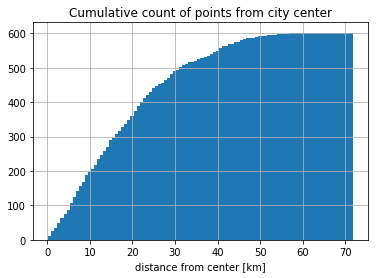

In [13]:
ax = df['distance'].hist(cumulative=True, density=False, bins=100)
ax.set(title="Cumulative count of points from city center", xlabel='distance from center [km]')
plt.show()

We select points located within distance inferior than 6 km from the center.

In [18]:
df_reduced = df[df.distance<6]
df_reduced = df_reduced.drop_duplicates(subset=['latitude', 'longitude'])
df_reduced = df_reduced.reset_index()
df_reduced

,index,code,name,latitude,longitude,distance
0,0,2000,Australia Square Post Office,-33.864711,151.208021,0.953897
1,1,2000,Circular Quay,-33.861137,151.212646,1.459230
2,2,2000,Clarence Street Post Office,-33.867623,151.207189,0.623092
3,3,2000,Cockatoo Island,-33.847056,151.171636,4.326412
4,4,2000,Darling Harbour,-33.874880,151.200900,0.536722
5,5,2000,Dawes Point,-33.856000,151.207000,1.908252
6,6,2000,Garden Island,-33.858892,151.229433,2.661501
7,8,2000,Haymarket,-33.880920,151.202940,0.912709
8,9,2000,Millers Point,-33.860850,151.202810,1.407681
9,10,2000,Parliament House Sydney,-33.865938,151.217157,1.284528


In [19]:
# create map of sydney using latitude and longitude values
map_sydney = folium.Map(location=[latitude, longitude], zoom_start=12, min_zoom = 12)

# add markers to map
for lat, lng, name in zip(df['latitude'], df['longitude'], df['name']):
    
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_sydney)  


for lat, lng, name in zip(df_reduced['latitude'], df_reduced['longitude'], df_reduced['name']):
    
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_sydney)  
    
map_sydney

### Foursquare
For restaurants and thai restaurants, we compiles the data in:
1. a **dictionnary** associating suburbs and a list of restaurant ID in the corresponding suburb
2. a **master dataframe** with all restaurants data


In [21]:
client_id = '2BOEMTP4KLXR2U3PDY2XK0MOQWCKBOEM2MH0JKAP2ORI1QCL'

fname = storage_path+r'/FoursquareAPIKey.txt'
file  = open(fname, 'r')
client_secret = file.read()

version = '20180724'

In [52]:
category_thai='4bf58dd8d48988d149941735'
category_food='4d4b7105d754a06374d81259'

A quick try

In [49]:
radius =500
limit=100
lat =latitude
lon =longitude

In [53]:
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
        client_id, client_secret, version, lat, lon, category_food, radius, limit)
    
results = requests.get(url).json()


In [54]:
# assign relevant part of JSON to venues
venues = results['response']['venues']

# tranform venues into a dataframe
dataframe = pd.io.json.json_normalize(venues)
dataframe.head()

,categories,hasPerk,id,location.address,location.cc,location.city,location.country,location.crossStreet,location.distance,location.formattedAddress,location.labeledLatLngs,location.lat,location.lng,location.neighborhood,location.postalCode,location.state,name,referralId,venuePage.id
0,"[{'id': '4bf58dd8d48988d116941735', 'name': 'B...",False,4ec652d0f79041351b4a2979,236 Clarence St,AU,Sydney,Australia,Druitt St,70,"[236 Clarence St (Druitt St), Sydney NSW 2000,...","[{'label': 'display', 'lat': -33.8727470910648...",-33.872747,151.205800,NaN,2000,NSW,Hotel Sweeney's,v-1559295358,NaN
1,"[{'id': '4bf58dd8d48988d145941735', 'name': 'C...",False,4c5d36ed6ebe2d7f343ad22e,Shop 12 (facing Bathurst St) Ground Floor Rege...,AU,Sydney,Australia,NaN,122,[Shop 12 (facing Bathurst St) Ground Floor Reg...,"[{'label': 'display', 'lat': -33.8742807228728...",-33.874281,151.206569,NaN,2000,NSW,Chefs Gallery,v-1559295358,42730215
2,"[{'id': '4bf58dd8d48988d16d941735', 'name': 'C...",False,592fcdf29ef8ef6604fa5b64,500 George Street,AU,Sydney,Australia,NaN,132,"[500 George Street, Sydney NSW 2000, Australia]","[{'label': 'display', 'lat': -33.8722186884685...",-33.872219,151.207153,Sydney City Center,2000,NSW,The Grounds Of The City,v-1559295358,NaN
3,"[{'id': '4bf58dd8d48988d1e0931735', 'name': 'C...",False,4b0b7029f964a520793123e3,"T69, Lower Ground Floor, Queen Victoria Building",AU,Sydney,Australia,455 George St,115,"[T69, Lower Ground Floor, Queen Victoria Build...","[{'label': 'display', 'lat': -33.8722137670364...",-33.872214,151.206754,NaN,2000,NSW,Starbucks,v-1559295358,NaN
4,"[{'id': '4bf58dd8d48988d16e941735', 'name': 'F...",False,531e435a498ed6010f58e241,252 Pitt St,AU,Sydney,Australia,nr Park St,171,"[252 Pitt St (nr Park St), Sydney NSW 2000, Au...","[{'label': 'display', 'lat': -33.8728356967850...",-33.872836,151.208145,NaN,2000,NSW,Hungry Jack's,v-1559295358,NaN


After succesful try with Foursquare API, we enclose our previous code in a function to get ventures for resturants and thai restaurants

In [57]:
radius=500
limit=100

In [147]:
def get_venture(category, df_reduced, radius, limit):   
    dict_suburb ={}
    df_master = pd.DataFrame()

    for i in df_reduced.index:
        lat= df_reduced.loc[i,'latitude']
        lon= df_reduced.loc[i,'longitude']
        try:
            url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(client_id, client_secret, version, lat, lon, category, radius, limit)
            results = requests.get(url).json() 

            # assign relevant part of JSON to venues
            venues = results['response']['venues']

            # tranform venues into a dataframe
            df_t = pd.io.json.json_normalize(venues)

            dict_suburb[i] = df_t['id'].to_list()
            df_master=df_master.append(df_t, ignore_index=True)

        except:
            dict_suburb[i]=np.nan
            pass
        
    df_master = df_master.drop_duplicates(subset=['id'])
    df_master = df_master.reset_index()
    return dict_suburb, df_master



In [148]:
thai_suburb, thai_master = get_venture(category_thai,df_reduced, radius, limit)

In [73]:
food_suburb, food_master = get_venture(category_food,df_reduced, radius, limit)

In [74]:
thai_master.shape

(426, 20)

In [75]:
food_master.shape

(2577, 20)

In [79]:
# checkpoint
# export
thai_master.to_hdf('thai_master.h5', key='df')
food_master.to_hdf('food_master.h5', key='df')

with open('thai_suburb.pkl', 'wb') as f:
    pickle.dump(thai_suburb, f)
    
with open('food_suburb.pkl', 'wb') as f:
    pickle.dump(food_suburb, f)


C:\ProgramData\Miniconda3\lib\site-packages\pandas\core\generic.py:2377: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block3_values] [items->['categories', 'id', 'location.address', 'location.cc', 'location.city', 'location.country', 'location.crossStreet', 'location.formattedAddress', 'location.labeledLatLngs', 'location.neighborhood', 'location.postalCode', 'location.state', 'name', 'referralId', 'venuePage.id']]

  return pytables.to_hdf(path_or_buf, key, self, **kwargs)


In [9]:
# checkpoint
# import
try:
    with open('thai_suburb.pkl', 'rb') as f:
        thai_suburb = pickle.load(f)
    with open('food_suburb.pkl', 'rb') as f:
        food_suburb = pickle.load(f)
    
    thai_master=pd.read_hdf('thai_master.h5', key='df')
    food_master=pd.read_hdf('food_master.h5', key='df')
except:
    pass

We can plot a map with:
* central suburbs in **blue**
* restaurants in **red**
* thai restaurants in **yellow**

In [150]:
# create map of sydney using latitude and longitude values
map_sydney = folium.Map(location=[latitude, longitude], zoom_start=12, min_zoom = 12)

# add markers to map
for lat, lng, name in zip(df_reduced['latitude'], df_reduced['longitude'], df_reduced['name']):
   
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_sydney)
    
for lat, lng, name in zip(food_master['location.lat'], food_master['location.lng'], food_master['name']):
    
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_sydney)  
    
for lat, lng, name in zip(thai_master['location.lat'], thai_master['location.lng'], thai_master['name']):

    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_sydney)  
    
map_sydney

## Methodology

So far, we have collected the required data:
1. Name, code, coordinates and distance to center for each **suburb**
2. Location, type of **restaurants** and identified the thai ones (according to Foursquare) **within 6km from Sydney's town hall**

Next, we will:
1. Compute **restaurant density** per suburb and ideally identify low density areas with few/no thai restaurants
2. Focus on most promising areas and within those create **clusters of locations that meet some basic requirements** established in discussion with stakeholders: we will take into consideration locations with **no more than two restaurants in radius of 250 meters**, and we want locations **without Italian restaurants in radius of 400 meters**. We will present map of all such locations but also create clusters (using **k-means clustering**) of those locations to identify general zones / neighborhoods / addresses which should be a starting point for final 'street level' exploration and search for optimal venue location by stakeholders.

## Analysis

We perform exploratory analysis by computing for every suburb:
1. Number of restaurants 
2. Distance to the nearest thai restaurant

In [11]:
# Number of restaurants 
for i in df_reduced.index:
    try:
        df_reduced.loc[i,'count restaurant'] = int(len(food_suburb[i]))
    except:
         df_reduced.loc[i,'count restaurant'] = 0

In [12]:
df_reduced.head()

,index,code,name,latitude,longitude,distance,count restaurant
0,0,2000,Australia Square Post Office,-33.864711,151.208021,0.953897,50.0
1,1,2000,Circular Quay,-33.861137,151.212646,1.459230,50.0
2,2,2000,Clarence Street Post Office,-33.867623,151.207189,0.623092,50.0
3,3,2000,Cockatoo Island,-33.847056,151.171636,4.326412,10.0
4,4,2000,Darling Harbour,-33.874880,151.200900,0.536722,50.0


In [13]:
for i in df_reduced.index:    
    
    try:
        suburb =(df_reduced.loc[i,'latitude'],df_reduced.loc[i,'longitude'])
        id_restaurant = thai_suburb[i] 
        mask = thai_master['id'].isin(id_restaurant)
        coord = thai_master.loc[mask][['location.lat','location.lng']]
        
        suburb =(df_reduced.loc[i,'latitude'],df_reduced.loc[i,'longitude'])
        distance = coord.apply(lambda x : geopy.distance.distance((x['location.lat'],x['location.lng']),suburb).km,axis=1)
        df_reduced.loc[i,'nearest thai'] = min(distance)
    except:
        df_reduced.loc[i,'nearest thai'] = 0.6

In [14]:
df_reduced

,index,code,name,latitude,longitude,distance,count restaurant,nearest thai
0,0,2000,Australia Square Post Office,-33.864711,151.208021,0.953897,50.0,0.028716
1,1,2000,Circular Quay,-33.861137,151.212646,1.459230,50.0,0.261723
2,2,2000,Clarence Street Post Office,-33.867623,151.207189,0.623092,50.0,0.089113
3,3,2000,Cockatoo Island,-33.847056,151.171636,4.326412,10.0,0.600000
4,4,2000,Darling Harbour,-33.874880,151.200900,0.536722,50.0,0.099456
5,5,2000,Dawes Point,-33.856000,151.207000,1.908252,50.0,0.344617
6,6,2000,Garden Island,-33.858892,151.229433,2.661501,4.0,0.600000
7,8,2000,Haymarket,-33.880920,151.202940,0.912709,50.0,0.017219
8,9,2000,Millers Point,-33.860850,151.202810,1.407681,50.0,0.437388
9,10,2000,Parliament House Sydney,-33.865938,151.217157,1.284528,48.0,0.154754


In [15]:
print('Average distance [km] to closest thai restaurant from each area center:', df_reduced['nearest thai'].mean())

Average distance [km] to closest thai restaurant from each area center: 0.2962830610862918


We download GeoJson file delimiting sydney suburbs

In [151]:
url = 'https://raw.githubusercontent.com/tim-massey/sydney-geojson/master/sydney.geojson'
data = requests.get(url).json()

In [142]:
del data

In [98]:
def boroughs_style(feature):
    return { 'color': 'blue', 'fill': False }

We can plot heatmap of resturants in sydney with white radiuses (1km,2km and 3km) from the center

In [154]:
from folium import plugins
from folium.plugins import HeatMap

map_sydney = folium.Map(location=(latitude,longitude), zoom_start=15, min_zoom = 13)
folium.TileLayer('cartodbpositron').add_to(map_sydney) #cartodbpositron cartodbdark_matter
HeatMap(zip(food_master['location.lat'], food_master['location.lng'])).add_to(map_sydney)
folium.Circle((latitude,longitude), radius=1000, fill=False, color='white').add_to(map_sydney)
folium.Circle((latitude,longitude), radius=2000, fill=False, color='white').add_to(map_sydney)
folium.Circle((latitude,longitude), radius=3000, fill=False, color='white').add_to(map_sydney)
folium.GeoJson(data, style_function=boroughs_style, name='geojson').add_to(map_sydney)
map_sydney

We can plot heatmap of thai resturants in sydney with white radiuses (1km,2km and 3km) from the center

In [140]:
map_sydney = folium.Map(location=(latitude,longitude), zoom_start=13, min_zoom = 13)

folium.TileLayer('cartodbpositron').add_to(map_sydney) #cartodbpositron cartodbdark_matter
HeatMap(zip(thai_master['location.lat'], thai_master['location.lng'])).add_to(map_sydney)
folium.Marker((latitude,longitude)).add_to(map_sydney)
folium.Circle((latitude,longitude), radius=1000, fill=False, color='white').add_to(map_sydney)
folium.Circle((latitude,longitude), radius=2000, fill=False, color='white').add_to(map_sydney)
folium.Circle((latitude,longitude), radius=3000, fill=False, color='white').add_to(map_sydney)
folium.GeoJson(data, style_function=boroughs_style, name='geojson').add_to(map_sydney)
map_sydney

We notice how dense is already the offer for restaurant in the center but we can find a pocket around the suburbs of Glebe, Pyrmont and Ultimo.
We define a rectangle with coordinates (-33.868,151.187) and (-33.8839,151.202)

In [103]:
# computing sides of rectangle
print(geopy.distance.distance((-33.868,151.187),(-33.868,151.202)).km)
print(geopy.distance.distance((-33.868,151.187),(-33.8839,151.187)).km)

1.3879116044680373
1.7636303430595779


In [104]:
# defining grid
lat_poss = list(np.linspace(-33.868,-33.8839,17))
long_poss = list(np.linspace(151.187,151.202,13))

In [105]:
# computing all combinations
from itertools import product
prod = list(product(*[lat_poss,long_poss ]))

We plot our candidate locations

In [158]:
map_sydney = folium.Map(location=[latitude, longitude], zoom_start=14, min_zoom = 14)
folium.Marker((latitude,longitude)).add_to(map_sydney)
folium.Circle((latitude,longitude), radius=1000, fill=False, color='white').add_to(map_sydney)
folium.Circle((latitude,longitude), radius=2000, fill=False, color='white').add_to(map_sydney)
folium.Circle((latitude,longitude), radius=3000, fill=False, color='white').add_to(map_sydney)

# add markers to map
for i in prod:
    folium.CircleMarker(
        [i[0], i[1]],
        radius=2,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_sydney)
map_sydney

We define a dataframe with our potential locations. We will filther them according to some threshols define below

In [71]:
potential =pd.DataFrame()


In [72]:
for i,v in enumerate(prod):
    potential.loc[i,'X']=v[1]
    potential.loc[i,'Y']=v[0]

In [73]:
potential

,X,Y
0,151.18700,-33.868000
1,151.18825,-33.868000
2,151.18950,-33.868000
3,151.19075,-33.868000
4,151.19200,-33.868000
5,151.19325,-33.868000
6,151.19450,-33.868000
7,151.19575,-33.868000
8,151.19700,-33.868000
9,151.19825,-33.868000


We count the number of restaurant within 100, 200 and 300m for each location.

In [74]:
for i in potential.index:
    distance_rest = food_master.apply(lambda x : geopy.distance.distance((x['location.lat'],x['location.lng']),(potential.loc[i,'Y'],potential.loc[i,'X'])).km,axis=1)
    potential.loc[i,'rest100']= distance_rest[distance_rest<0.1].count()
    potential.loc[i,'rest200']= distance_rest[distance_rest<0.2].count()
    potential.loc[i,'rest300']= distance_rest[distance_rest<0.3].count()

In [75]:
potential

,X,Y,rest100,rest200,rest300
0,151.18700,-33.868000,0.0,0.0,0.0
1,151.18825,-33.868000,0.0,0.0,0.0
2,151.18950,-33.868000,0.0,0.0,0.0
3,151.19075,-33.868000,0.0,0.0,0.0
4,151.19200,-33.868000,0.0,0.0,3.0
5,151.19325,-33.868000,0.0,0.0,7.0
6,151.19450,-33.868000,0.0,3.0,10.0
7,151.19575,-33.868000,0.0,7.0,12.0
8,151.19700,-33.868000,0.0,6.0,11.0
9,151.19825,-33.868000,0.0,1.0,13.0


We count the number of thai restaurant within 200, 300 and 400m for each location.

In [76]:
for i in potential.index:
    distance_rest = thai_master.apply(lambda x : geopy.distance.distance((x['location.lat'],x['location.lng']),(potential.loc[i,'Y'],potential.loc[i,'X'])).km,axis=1)
    potential.loc[i,'thai200']= distance_rest[distance_rest<0.2].count()
    potential.loc[i,'thai300']= distance_rest[distance_rest<0.3].count()
    potential.loc[i,'thai400']= distance_rest[distance_rest<0.4].count()

In [77]:
potential

,X,Y,rest100,rest200,rest300,thai200,thai300,thai400
0,151.18700,-33.868000,0.0,0.0,0.0,0.0,0.0,0.0
1,151.18825,-33.868000,0.0,0.0,0.0,0.0,0.0,0.0
2,151.18950,-33.868000,0.0,0.0,0.0,0.0,0.0,0.0
3,151.19075,-33.868000,0.0,0.0,0.0,0.0,0.0,1.0
4,151.19200,-33.868000,0.0,0.0,3.0,0.0,1.0,1.0
5,151.19325,-33.868000,0.0,0.0,7.0,0.0,1.0,3.0
6,151.19450,-33.868000,0.0,3.0,10.0,0.0,3.0,5.0
7,151.19575,-33.868000,0.0,7.0,12.0,0.0,4.0,5.0
8,151.19700,-33.868000,0.0,6.0,11.0,1.0,3.0,5.0
9,151.19825,-33.868000,0.0,1.0,13.0,0.0,3.0,5.0


We request that our candidate locations have:
1. no more than 3 resturants within 300m
2. no thai restaurants within 300m
We can count 43 locations according with respect to these conditions

In [85]:
good_rest =potential[potential['rest300']<4]
good_rest.count().mean()

57.0

In [86]:
good_thai =potential[potential['thai300']<1]
good_thai.count().mean()

61.0

In [87]:
good_potential=potential.loc[good_rest.index.intersection(good_thai.index)]
good_potential.count().mean()

43.0

We can plot them

In [136]:
# create map of sydney using latitude and longitude values
map_sydney = folium.Map(location=[latitude, longitude], zoom_start=14, min_zoom = 14)

# add markers to map
for lat, lng in zip(good_potential['Y'], good_potential['X']):

    folium.CircleMarker(
        [lat, lng],
        radius=2,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_sydney)
map_sydney    

We use K-mean clustering to retrieve the center of 3 clusters. We notice points in the water and two main onshore cluster. The 3rd cluster should comprise the offshore points.

In [95]:
from sklearn.cluster import KMeans

number_of_clusters = 3

good_xys = good_potential[['X', 'Y']].values
kmeans = KMeans(n_clusters=number_of_clusters, random_state=0).fit(good_xys)

In [90]:
kmeans.cluster_centers_

array([[151.1925    , -33.87744063],
       [151.18860714, -33.86934866],
       [151.18811111, -33.87374167]])

In [93]:
cluster_centers= pd.DataFrame(kmeans.cluster_centers_, columns=['X','Y'])

In [94]:
cluster_centers

,X,Y
0,151.192500,-33.877441
1,151.188607,-33.869349
2,151.188111,-33.873742


We plot locations in red and cluster centers in green

In [137]:
# create map of sydney using latitude and longitude values
map_sydney = folium.Map(location=[latitude, longitude], zoom_start=14, min_zoom = 14)

for lat, lng in zip(good_potential['Y'], good_potential['X']):

    folium.CircleMarker(
        [lat, lng],
        radius=2,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_sydney)

# add markers to map
for lat, lng in zip(cluster_centers['Y'], cluster_centers['X']):

    folium.CircleMarker(
        [lat, lng],
        radius=2,
        color='green',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_sydney)
map_sydney    

This concludes our analysis. We have created 3 points representing centers of zones containing locations with low number of restaurants and no Italian restaurants nearby, all zones being fairly close to city center (all less between 1 and 2km from the center). The cluster centers should be considered only as a starting point for exploring area neighborhoods in search for potential restaurant locations. Most of the zones are Glebe, Pyrmont and Ultimo boroughs, which we have identified as interesting due to being recently trndy, fairly close to city center and well connected by public transport.

## Results and Discussion

Our analysis shows that although there is a great number of restaurants in Sydney, there are pockets of low restaurant density fairly close to city center. 

Highest concentration of restaurants was detected north, east and south from the city town hall, so we focused our attention to areas west corresponding to boroughs Glebe, Pyrmont and Ultimo borough. 

After directing our attention to this more narrow area of interest (covering approx. 2x2km) we first created a dense grid of location candidates (spaced 100m appart); those locations were then filtered so that those with more than two restaurants in radius of 300m and those with a thai closer than 300m were removed.

Those location candidates were then clustered to create zones of interest which contain greatest number of location candidates. 

Result of all this is 3 zones containing largest number of potential new restaurant locations based on number of and distance to existing venues - both restaurants in general and Thai restaurants particularly. This, of course, does not imply that those zones are actually optimal locations for a new restaurant! Purpose of this analysis was to only provide info on areas close to Sydney center but not crowded with existing restaurants (particularly Thai) - it is entirely possible that there is a very good reason for small number of restaurants in any of those areas, reasons which would make them unsuitable for a new restaurant regardless of lack of competition in the area. Recommended zones should therefore be considered only as a starting point for more detailed analysis which could eventually result in location which has not only no nearby competition but also other factors taken into account and all other relevant conditions met.

## Conclusion

Purpose of this project was to identify Sydney areas close to center with low number of restaurants (particularly Thai restaurants) in order to aid stakeholders in narrowing down the search for optimal location for a new Thai restaurant. By calculating restaurant density distribution from Foursquare data we have first identified general boroughs that justify further analysis (Glebe, Ultimo and Pyrmont), and then generated extensive collection of locations which satisfy some basic requirements regarding existing nearby restaurants. Clustering of those locations was then performed in order to create major zones of interest (containing greatest number of potential locations) to be used as starting points for final exploration by stakeholders.

Final decission on optimal restaurant location will be made by stakeholders based on specific characteristics of neighborhoods and locations in every recommended zone, taking into consideration additional factors like attractiveness of each location (proximity to park or water), levels of noise / proximity to major roads, real estate availability, prices, social and economic dynamics of every neighborhood etc.